# Рынок заведений общественного питания Москвы.

Описание проекта.

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.

Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

Описание данных

Файл moscow_places.csv:

name — название заведения;

address — адрес заведения;

category — категория заведения, например «кафе», «пиццерия» или «кофейня»;

hours — информация о днях и часах работы;

lat — широта географической точки, в которой находится заведение;

lng — долгота географической точки, в которой находится заведение;

rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);

price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;

avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:

«Средний счёт: 1000–1500 ₽»;

«Цена чашки капучино: 130–220 ₽»;

«Цена бокала пива: 400–600 ₽».

и так далее;

middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:

Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.

Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.

Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:

Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.

Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.

Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.

chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);

district — административный район, в котором находится заведение, например Центральный административный округ;

seats — количество посадочных мест.

## Загрузка данных и изучение общей информации

In [1]:
#импорт библиотек
import seaborn as sns
from matplotlib import pyplot as plt
import plotly.express as px
from plotly import graph_objects as go
import pandas as pd
import datetime as dt
import numpy as np
from pandas.plotting import register_matplotlib_converters
import scipy.stats as stats
import warnings
import folium
from folium import Map, Choropleth
from folium import Map, Marker
from folium.plugins import MarkerCluster

In [2]:
# загружаем данные
data = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
#изучим общую информацию 
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
#выведем первые 10 строк для ознакомления
data.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


### Вывод.
В исходной таблице в столбце name 8406 строк, что говорит о 8046 заведениях.

## Предобработка данных

### Проверка на дубликаты в данных

In [5]:
#проверка на дубликаты
print('Количество дубликатов в датасете:', data.duplicated().sum())

Количество дубликатов в датасете: 0


### Вывод.
Дубликаты отсутствуют.

### Проверка на пропуски

In [6]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

In [7]:
#заменим пропуски в столбцах  hours, price, avg_bill на 'Неизвестно' - данные в этих столбцах нецифровые и не исказять результаты
data['hours'].fillna(value='Неизвестно', inplace=True)
data['price'].fillna(value='Неизвестно', inplace=True)

In [8]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                   0
lat                     0
lng                     0
rating                  0
price                   0
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Пропуски в столбцах avg_bill, middle_avg_bill, middle_coffee_cup, seats оставим как есть и не будем ничем заполнять (ни медианой ни средним), чтобы не искажать объективной картины.                

In [9]:
# в проекте подразумевается много операций с категориями заведений,поэтому убедимся, что в названиях нет ошибок и опечаток
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

### Предобработка данных

Создадим дополнительные столбцы для последующего анализа:

•	 street с названиями улиц из столбца с адресом.

•	 is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):

    логическое значение True — если заведение работает ежедневно и круглосуточно;
    логическое значение False — в противоположном случае.

In [10]:
#создаем столбец с названием улицы
words = ['ул.','проезд','шоссе','улица','переулок','микрорайон','мкад','проспект','пр.',
         'площадь','аллея','бульвар','набережная','сквер','тупик','линия','территория',
         'квартал','просек', 'парк','мост']
 
str_pat = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(words))
 
data['street'] = data['address'].str.extract(str_pat)

In [11]:
data['street'].isna().sum()

203

В столбце street 203 пропуска. Видимо в данных нет информации об адресе или в адресе нет слов, которые мы задали для поиска. 203 пропуска для всей таблицы в 8406 строк составляет всего 2%. Можем удалить эти строки.

In [12]:
#удаляем строки с пропусками в столбце street
data.dropna(subset=['street'], inplace=True)

In [13]:
#столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)
data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')

In [14]:
#выведем 5 строк обновленного датасета
data.sample(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
1502,Cofix,кофейня,"Москва, 2-й Войковский проезд, 2/11",Северный административный округ,"пн-пт 08:00–21:00; сб,вс 10:00–20:00",55.817642,37.496831,4.0,Неизвестно,Цена чашки капучино:от 60 ₽,NaN,60.0,1,8.0,2-й Войковский проезд,False
3657,Sultan Pizza & Burgers,пиццерия,"Москва, улица Новый Арбат, 15",Центральный административный округ,"ежедневно, 12:00–00:00",55.752126,37.591836,4.7,Неизвестно,NaN,NaN,NaN,0,250.0,улица Новый Арбат,False
4992,Гудман,ресторан,"Москва, Павелецкая площадь, 2, стр. 1",Центральный административный округ,"пн-пт 11:00–00:00; сб,вс 12:00–00:00",55.730490,37.634358,4.5,высокие,Средний счёт:1500–2000 ₽,1750.0,NaN,1,150.0,Павелецкая площадь,False
7108,Грин Лондон,столовая,"Москва, 2-й Котляковский переулок, 1, стр. 35",Южный административный округ,пн-пт 09:00–18:00,55.648557,37.638356,4.7,средние,Средний счёт:299 ₽,299.0,NaN,0,40.0,2-й Котляковский переулок,False
8198,Милти,быстрое питание,"Москва, улица Ленинская Слобода, 19",Южный административный округ,пн-пт 09:00–19:00,55.708303,37.652822,3.8,Неизвестно,NaN,NaN,NaN,0,450.0,улица Ленинская Слобода,False


#### Вывод.
1. После обнаружения пропусков в исходных данных было принято решения не удалять стороки с пропусками
2. После предобратки мы получили достаточно полные данные, которых достаточно для проведения последующего анализа. 

## Анализ данных

###	Определим, какие категории заведений представлены в данных.


In [15]:
#определим количество объектов общественного питания по категориям
data_categories = data.groupby('category').agg({'category': "count"})
data_categories.columns = ['count']
data_categories = data_categories.sort_values('count', ascending = False).reset_index()
display(data_categories)

,category,count
0,кафе,2266
1,ресторан,2026
2,кофейня,1379
3,"бар,паб",759
4,пиццерия,628
5,быстрое питание,581
6,столовая,311
7,булочная,253


In [16]:
# сделаем визуализацию, строим диаграмму с сегментами
fig = go.Figure(data=[go.Pie(labels=data_categories['category'], # указываем значения, которые появятся на метках сегментов
                             values=data_categories['count'], # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Соотношение количества заведений общественного питания по категориям', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Категории',
                                    showarrow=False)])
fig.show() # выводим график

#### Вывод.
1. Лидером по количеству заведений является категория кафе.
2. Второе место у ресторанов, третье у кофеен.
3. Аутсайдеры: булочная и столовая.
4. Общее количество категорий: 8.


### Определим количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и т.д.

In [17]:
#для подсчета посадочных мест сгруппируем по категории и вычыслим медианное значение; отсортируем по убыванию
data_seats = data.groupby('category', as_index=False).agg({'seats':'median'}).sort_values(by='seats', ascending=False).reset_index()
display(data_seats)

,index,category,seats
0,6,ресторан,86.0
1,0,"бар,паб",82.5
2,4,кофейня,80.0
3,7,столовая,75.5
4,2,быстрое питание,65.0
5,3,кафе,60.0
6,5,пиццерия,55.0
7,1,булочная,50.0


In [18]:
#визуализируем результаты, строим столбчатую диаграмму 
fig = px.bar(data_seats, # загружаем данные и заново их сортируем
             x='seats', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='seats' # добавляем аргумент, который отобразит текст с информацией
            )
# оформляем график
fig.update_layout(title='Количество посадочных мест в заведениях',
                   xaxis_title='Количество посадочных мест',
                   yaxis_title='Категория заведения')
fig.show() # выводим график

#### Вывод.
1. Рестораны на первом месте по медианному количеству посадочных мест.
2. Второе место с небольшим отставанием у баров и пабов.
3. На третьем месте кофейни.
4. В булочных и пиццериях меньше всего посадочных мест.


### Рассмотрим соотношение сетевых и несетевых заведений в датасете

In [19]:
#поменяем о и 1 в столбце chain на несетевое и сетевое для удобства отображения
data['chain'] = data['chain'].replace(0,"несетевое")
data['chain'] = data['chain'].replace(1,"сетевое")

In [20]:
#группируем по столбцу chain
data_chain = data.groupby('chain', as_index=False).agg({'name':'count', 'chain':'unique'}).sort_values(by='chain', ascending=False).reset_index()
display(data_chain)

,index,name,chain
0,1,3132,[сетевое]
1,0,5071,[несетевое]


In [21]:
# строим диаграмму с сегментами для визуализации
fig = go.Figure(data=[go.Pie(labels=data_chain['chain'], # указываем значения, которые появятся на метках сегментов
                             values=data_chain['name'], # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Соотношение сетевых и несетевых заведений', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Вид заведения',
                                    showarrow=False)])
fig.show() # выводим график

#### Вывод.
Несетевых заведений больше, чем сетевых в полтора раза.

### Исследуем, какие категории заведений чаще являются сетевыми

In [22]:
#группируем по столбцам chain и category
data_chain_category =  data.pivot_table(index=['category', 'chain'],aggfunc='count')['name'].reset_index().sort_values(by='category')
display(data_chain_category)

,category,chain,name
0,"бар,паб",несетевое,592
1,"бар,паб",сетевое,167
2,булочная,несетевое,97
3,булочная,сетевое,156
4,быстрое питание,несетевое,359
5,быстрое питание,сетевое,222
6,кафе,несетевое,1517
7,кафе,сетевое,749
8,кофейня,несетевое,681
9,кофейня,сетевое,698


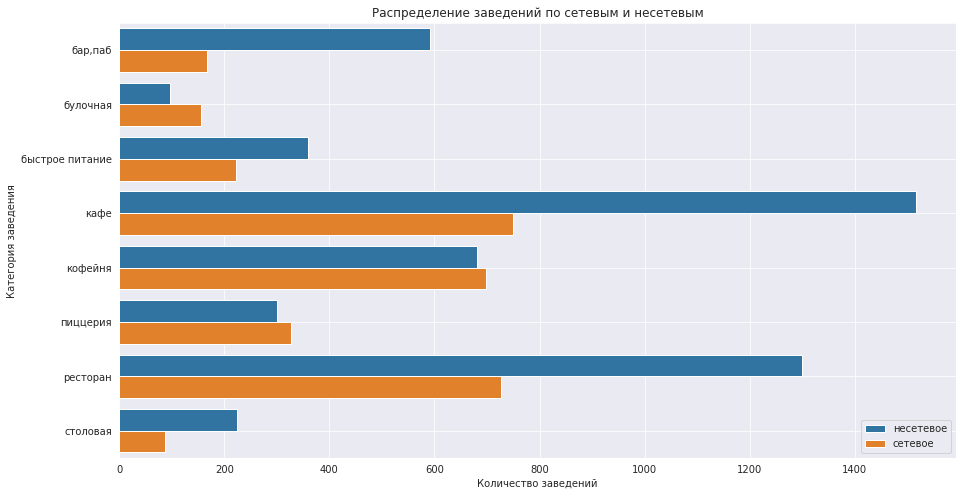

In [23]:
#сделаем визуализацию, построим столбчатую диаграмму из библиотеки seaborn
sns.set_style('dark')
# назначаем размер графика
plt.figure(figsize=(15, 8))
# строим столбчатый график средствами seaborn
sns.barplot(x='name', y='category', data=data_chain_category, hue='chain')
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение заведений по сетевым и несетевым')
plt.xlabel('Количество заведений')
plt.ylabel('Категория заведения')
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='lower right', fontsize=10)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

In [24]:
#группируем по столбцу chain
data_chain_percent = data.groupby('category', as_index=False).agg({'name':'count'}).sort_values(by='category', ascending=False).reset_index()
#узнаем количество сетевых заведений по категориям
data_chain_percent_chain = data[data['chain'] == 'сетевое' ].groupby('category').agg({'name':'count'}).sort_values(by='category', ascending=False).reset_index()
#добавляем столбец с данными по количеству сетевых заведений
data_chain_percent['chain'] = data_chain_percent_chain['name']
#вычисляем процент сетевых заведений
data_chain_percent['prc'] = round((data_chain_percent['chain'] / data_chain_percent['name'])*100, 1)
data_chain_percent = data_chain_percent.sort_values(by='prc', ascending=False).reset_index()
display(data_chain_percent)

,level_0,index,category,name,chain,prc
0,6,1,булочная,253,156,61.7
1,2,5,пиццерия,628,327,52.1
2,3,4,кофейня,1379,698,50.6
3,5,2,быстрое питание,581,222,38.2
4,1,6,ресторан,2026,726,35.8
5,4,3,кафе,2266,749,33.1
6,0,7,столовая,311,87,28.0
7,7,0,"бар,паб",759,167,22.0


In [25]:
#выведем таблицу и покажем по каждой категории количество сетевых и несетевых заведений
data.pivot_table(index='category', columns='chain', values='name', aggfunc='count')

chain,несетевое,сетевое
category,,
"бар,паб",592,167
булочная,97,156
быстрое питание,359,222
кафе,1517,749
кофейня,681,698
пиццерия,301,327
ресторан,1300,726
столовая,224,87


In [26]:
# строим столбчатую диаграмму 
fig = px.bar(data_chain_percent, # загружаем данные и заново их сортируем
             x='prc', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='prc' # добавляем аргумент, который отобразит текст с информацией
            )
# оформляем график
fig.update_layout(title='Количество сетевых заведений по категориям',
                   xaxis_title='Процент сетевых заведений',
                   yaxis_title='Категория заведения')
fig.show() # выводим график

#### Вывод.
1. Чаще всего сетевыми заведениями являются булочные пиццерии и кофейни.
2. Меньше всего сетевых баров и столовых.


### Найдем топ-15 популярных сетей в Москве. 


In [27]:
#выберем топ-15 сетевых заведений по популярности 
top_15 = data.query('chain== "сетевое"').groupby('name').agg({'name': "count"})
top_15.columns = ['count']
top_15 = top_15.sort_values('count', ascending = False).reset_index()
top_15.drop(top_15[top_15['count'] < 34].index, inplace=True)
top_15.head(20)

,name,count
0,Шоколадница,120
1,Домино'с Пицца,76
2,Додо Пицца,74
3,One Price Coffee,71
4,Яндекс Лавка,69
5,Cofix,65
6,Prime,50
7,КОФЕПОРТ,42
8,Хинкальная,41
9,Теремок,38


In [28]:
#оставим первые 15 строк
top_15 = top_15.iloc[0:15]
top_15

,name,count
0,Шоколадница,120
1,Домино'с Пицца,76
2,Додо Пицца,74
3,One Price Coffee,71
4,Яндекс Лавка,69
5,Cofix,65
6,Prime,50
7,КОФЕПОРТ,42
8,Хинкальная,41
9,Теремок,38


In [29]:
# строим столбчатую диаграмму для визуализации
fig = px.bar(top_15, # загружаем данные и заново их сортируем
             x='count', # указываем столбец с данными для оси X
             y='name', # указываем столбец с данными для оси Y
             text='count' # добавляем аргумент, который отобразит текст с информацией
            )
# оформляем график
fig.update_layout(title='ТОП-15 сетевых заведений',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название сети')
fig.show()

Определим, к каким категориям относятся заведения из топ-15. Для этого в основном датафрейме data оставим только заведения из топ-15.

In [30]:
data_top_15 = data[data['name'].isin(top_15['name'])]

#группировка по категориям
data_top_15_category = data_top_15.groupby('category').agg({'category': "count"})
data_top_15_category.columns = ['count']
data_top_15_category = data_top_15_category.sort_values('count', ascending = False).reset_index()
display(data_top_15_category)

,category,count
0,кофейня,297
1,ресторан,178
2,пиццерия,150
3,кафе,81
4,быстрое питание,9
5,"бар,паб",3
6,столовая,1


In [31]:
# строим диаграмму с сегментами для визуализации
fig = go.Figure(data=[go.Pie(labels=data_top_15_category['category'], # указываем значения, которые появятся на метках сегментов
                             values=data_top_15_category['count'], # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Распределение категорий из ТОП-15 сетевых заведений', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Категории',
                                    showarrow=False)])
fig.show() # выводим график

Проанализиурем количество заведений из ТОП-15 каждой категории по районам

In [32]:
top_15_district = data_top_15.groupby(['district', 'category'], as_index=False).agg({'name':'count'}).sort_values(by='name', ascending=False)
display(top_15_district)

,district,category,name
29,Центральный административный округ,кофейня,88
31,Центральный административный округ,ресторан,55
28,Центральный административный округ,кафе,40
9,Западный административный округ,кофейня,37
13,Северный административный округ,кофейня,35
44,Южный административный округ,кофейня,31
18,Северо-Восточный административный округ,кофейня,31
46,Южный административный округ,ресторан,27
3,Восточный административный округ,кофейня,25
45,Южный административный округ,пиццерия,23


In [33]:
#создаем сводную таблицу по категориям заведений и районам
top_15 = data_top_15.pivot_table(index='district', columns = 'category', values='name', aggfunc = 'count')

# строим столбчатую диаграмму 
fig = px.bar(top_15, # загружаем данные и заново их сортируем
             barmode = 'group'
            )
# оформляем график
fig.update_layout(title='Распределение ТОП-15 сетевых заведений по районам',
                   xaxis_title='Районы',
                   yaxis_title='Количество заведений')
fig.show() # выводим график

#### Вывод.
1. Больше всего сетевых заведений в категории кофейня.
2. Самая крупная сеть - Шоколадница, Доминос пицца и Додо пицца на втором и третьем месте соответственно.
3. Во всех округах, кроме ЮВАО, больше всего сетевых заведений в категории кофейня.
4. Самая крупная сетевая кофейня - One Price Coffee занимает 4-е место по распространенности среди всех сетевых заведений.

### Какие административные районы Москвы присутствуют в датасете?
Отобразим общее количество заведений и количество заведений каждой категории по районам. 

In [34]:
#представленные в датасете административные районые есть в таблице top_15
display(top_15)

category,"бар,паб",быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,
Восточный административный округ,1.0,1.0,4.0,25.0,20.0,17.0,1.0
Западный административный округ,NaN,1.0,7.0,37.0,15.0,17.0,NaN
Северный административный округ,NaN,NaN,5.0,35.0,20.0,13.0,NaN
Северо-Восточный административный округ,NaN,2.0,5.0,31.0,19.0,14.0,NaN
Северо-Западный административный округ,NaN,2.0,1.0,19.0,13.0,7.0,NaN
Центральный административный округ,1.0,1.0,40.0,88.0,8.0,55.0,NaN
Юго-Восточный административный округ,NaN,1.0,8.0,12.0,16.0,11.0,NaN
Юго-Западный административный округ,1.0,1.0,8.0,19.0,16.0,17.0,NaN
Южный административный округ,NaN,NaN,3.0,31.0,23.0,27.0,NaN


In [35]:
#выведем общее количество заведений и по категориям в каждом административном районе
data_district = data_top_15.pivot_table(index='district', columns = 'category', values='name', aggfunc = 'count')
fig = px.bar(data_district)
fig.update_layout(title='Распределение заведений по районам',
                   xaxis_title='Районы',
                   yaxis_title='Количество заведений',
                 xaxis={'categoryorder':'total descending'})
fig.show() 

#### Вывод.
1. Больше всего заведений в ЦАО, на втором месте по количеству заведений ЮАО, на третьем ЗАО
2. Меньше всего в СЗАО, на втором месте с конца ЮВАО на третьем  ЮЗАО.
3. В большинстве округов количество заведений находится в промежутке от 40 до 90 единиц.
4. Четыре категории (ресторан, кофейня, пиццерия, кафе) лидируют по количеству заведений во всех округах.

### Визуализируем распределение средних рейтингов по категориям заведений

In [36]:
#группируем по категории и выводим среднее значение рейтинга
rating= data.groupby(["category"])['rating'].mean().reset_index().sort_values('rating', ascending=False)
rating['rating'] = round(rating['rating'],3)
display(rating)

,category,rating
0,"бар,паб",4.389
5,пиццерия,4.300
6,ресторан,4.290
4,кофейня,4.278
1,булочная,4.274
7,столовая,4.207
3,кафе,4.123
2,быстрое питание,4.045


In [37]:
#построим столбчатую диаграмму
fig = px.bar(rating, x='category', y='rating', text='rating')
fig.update_layout(title='Распределение средних рейтингов по категориям заведений', 
                  xaxis_title = 'Категория',
                  yaxis_title='Средний рейтинг',
                  yaxis_range=[4,4.5]) #установим лимит по оси рейтинга для большей наглядности
fig.show()

#### Вывод.
1. Лидер по среднему рейтингу - категория бар,паб, но различия в рейтингах по категориям несущественные.

### Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. 


In [38]:
#создадим датасет со средним рейтингом заведений по районам
avg_rating= data.groupby(["district"])['rating'].mean().reset_index().sort_values('rating')
display(avg_rating)

,district,rating
6,Юго-Восточный административный округ,4.094311
3,Северо-Восточный административный округ,4.148216
7,Юго-Западный административный округ,4.170912
0,Восточный административный округ,4.178333
1,Западный административный округ,4.178623
8,Южный административный округ,4.183314
4,Северо-Западный административный округ,4.203526
2,Северный административный округ,4.247279
5,Центральный административный округ,4.377213


In [39]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=avg_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m).geojson.add_child(
    folium.features.GeoJsonTooltip(['name'], labels=False)
)

# выводим карту
m

### Вывод.
1. Немного выше рейтинг заведений в ЦАО.
2. Самый низкий рейтинг заведений в ЮВАО.
3. Разница в средних рейтингах по районам, также как и по категориям менее 1 балла.

### Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium

In [40]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m 

### Найдем топ-15 улиц по количеству заведений 
Построим график распределения количества заведений и их категорий по этим улицам. 

In [41]:
#создаем список с названиями топ-15 улиц по количеству заведений
top_streets = data.groupby('street')['name'].count().sort_values(ascending=False)
top_streets = top_streets.head(15).index
display(top_streets)

Index(['проспект Мира', 'Профсоюзная улица', 'проспект Вернадского',
       'Ленинский проспект', 'Ленинградский проспект', 'Дмитровское шоссе',
       'Каширское шоссе', 'Варшавское шоссе', 'Ленинградское шоссе',
       'Люблинская улица', 'улица Вавилова', 'Кутузовский проспект',
       'улица Миклухо-Маклая', 'Пятницкая улица', 'Алтуфьевское шоссе'],
      dtype='object', name='street')

In [42]:
#создадим датафрейм с улицами из топ-15
top_15_streets = data[data['street'].isin(top_streets)]
#сгруппируем по улицам и категории
top_15_streets_category = top_15_streets.groupby(['street', 'category'])['name'].count().reset_index()
top_15_streets_category.head(15)

,street,category,name
0,Алтуфьевское шоссе,"бар,паб",5
1,Алтуфьевское шоссе,булочная,1
2,Алтуфьевское шоссе,быстрое питание,5
3,Алтуфьевское шоссе,кафе,13
4,Алтуфьевское шоссе,кофейня,9
5,Алтуфьевское шоссе,пиццерия,3
6,Алтуфьевское шоссе,ресторан,10
7,Алтуфьевское шоссе,столовая,1
8,Варшавское шоссе,"бар,паб",6
9,Варшавское шоссе,быстрое питание,7


In [43]:
#для визуализации построим барплот
fig = px.bar(top_15_streets_category,
             x='street',
             y='name',
             color = 'category')
fig.update_layout(title='Распределение количества заведений по улицам',
                   xaxis_title='Улицы',
                   yaxis_title='Количество заведений',
                 xaxis={'categoryorder':'total descending'})
fig.show() 

#### Вывод.
1. Проспект мира - лидер по количеству заведений.
2. Также много (больше ста) заведений на улицах Профсоюзной, проспект Вернадского и Ленинский проспект.
3. Замыкают ТОП-15 Алтуфьевское шоссе, Пятницкая и улица Миклухо-Маклая с количеством заведений около 50 штук.

### Найдем улицы, на которых находится только один объект общепита. Проанализируем, что можно сказать об этих заведениях?

In [44]:
#создаем таблицу с названием улиц, на которых расположен только один объект общепита
only_one_rest = data.pivot_table(index='street', values='name', aggfunc='count').sort_values(by='name', ascending=True)
only_one_rest = only_one_rest.query('name == 1').index
display(only_one_rest)

Index(['1-й Автозаводский проезд', 'Новомосковская улица',
       'Новопоселковая улица', 'Новороссийская улица', 'Новосущёвская улица',
       'Новощукинская улица', 'Новоясеневский тупик', 'Одинцовская улица',
       'Октябрьский переулок', 'Ордынский тупик',
       ...
       '14-я Парковая улица', 'Булатниковский проезд', 'Бибиревская улица',
       '12-я Парковая улица', '3-й проезд Перова Поля', 'Бутиковский переулок',
       '3-я Радиаторская улица', 'Бобров переулок', '1-й Капотнинский проезд',
       '3-й Хорошёвский проезд'],
      dtype='object', name='street', length=425)

In [45]:
#создадим датафрейм с улицами с единственным заведением
street_one_rest = data[data['street'].isin(only_one_rest)]
#сгруппируем по улицам и категории
one_rest_category = street_one_rest.groupby('category').agg({'category': "count"})
one_rest_category.columns = ['count']
one_rest_category = one_rest_category.sort_values('count', ascending = False).reset_index()
display(one_rest_category)

,category,count
0,кафе,142
1,ресторан,90
2,кофейня,74
3,"бар,паб",40
4,столовая,36
5,быстрое питание,20
6,пиццерия,14
7,булочная,9


In [46]:
# строим диаграмму с сегментами
fig = go.Figure(data=[go.Pie(labels=one_rest_category['category'], # указываем значения, которые появятся на метках сегментов
                             values=one_rest_category['count'], # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Категории заведений, на улицах с единственным заведением общепита', 
                  width=800, 
                  height=600,
                  annotations=[dict(x=1.12,
                                    y=1.05,
                                    text='Категории',
                                    showarrow=False)])
fig.show() # выводим график

In [47]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
street_one_rest.apply(create_clusters, axis=1)

# выводим карту
m 

#### Вывод.
1. Чем ближе к центру Москвы тем, больше улиц на которых находится только один объект общепита.
2. Значительная часть таких улиц недлинные, что характерно для центра города.
3. Больше всего единственных на улице заведений в категориях: кафе, ресторан и кофейня; меньше всего в категориях: булочная и пиццерия.

### Проанализируем как удалённость от центра влияет на цены в заведениях?
Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [48]:
#посчитаем медиану средних чеков по райнам
data.groupby('district')['middle_avg_bill'].median()

district
Восточный административный округ            575.0
Западный административный округ            1000.0
Северный административный округ             650.0
Северо-Восточный административный округ     500.0
Северо-Западный административный округ      700.0
Центральный административный округ         1000.0
Юго-Восточный административный округ        450.0
Юго-Западный административный округ         625.0
Южный административный округ                500.0
Name: middle_avg_bill, dtype: float64

In [49]:
#сгруппируем данные по району и отсортируем по медианному чеку
avg_bill = data.groupby(['district'])['middle_avg_bill'].median().reset_index().sort_values('middle_avg_bill')
display(avg_bill)

,district,middle_avg_bill
6,Юго-Восточный административный округ,450.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
0,Восточный административный округ,575.0
7,Юго-Западный административный округ,625.0
2,Северный административный округ,650.0
4,Северо-Западный административный округ,700.0
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0


In [50]:
#посмотрим на карте, как распределен медианный средний чек в заведениях
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средний счет заведений по районам',
).add_to(m).geojson.add_child(
    folium.features.GeoJsonTooltip(['name'], labels=False)
)
m

In [51]:
#построим столбчатую диаграмму
fig = px.bar(avg_bill, x='district', y='middle_avg_bill', text='middle_avg_bill')
fig.update_layout(title='Величина среднего чека общепита по районам Москвы', xaxis_title = 'Округи', yaxis_title='Средний чек')
fig.show()

#### Вывод.
1. Самые дорогие заведения общепита находятся в центре города, а также на западе в ЗАО.
2. Дешевле всего покушать в Юго-Восточном округе.

### Общий вывод.
1. В проведенном анализе 8 категорий заведений кафе, ресторан, кофейня, бары, пиццерия, булочная, столовая, быстрое питание.
2. Самые распространенные категории - кафе, ресторан, кофейня. Наименее распространненые - булочная, столовая.
3. Несетевых заведений больше, чем сетевых в полтора раза.
4. Чаще всего сетевыми заведениями являются кофейни, столовые и бары.
5. Во всех округах, кроме ЮВАО, больше всего сетевых заведений в категории кофейня.
6. Средние рейтинги различных категорий заведений и в разных округах Москвы приблизительно одинаковы.
7. В центре и западном направлении средний чек самый высокий. В ЮВАО - самый низкий.
8. Рестораны на первом месте по медианному количеству посадочных мест, дальше идут бары и кофейни.
9. Больше всего заведений в ЦАО, на втором месте по количеству заведений ЮАО, на третьем ЗАО.
10. Проспект мира - лидер по количеству заведений. Также много (больше ста) заведений на улицах Профсоюзной, проспект Вернадского и Ленинский проспект.Замыкают ТОП-15 Алтуфьевское шоссе, Пятницкая и улица Миклухо-Маклая с количеством заведений около 50 штук.

## Шаг 4. Детализируем исследование: открытие кофейни.
Заказчик рассматривает возможность открытия кофейни в Москве. Заказчики не боятся конкуренции в этой сфере. ПРоанализируем рынок и дадим рекомендации по открытию кофейни.

### Ответим на вопросы: Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [52]:
#создадим датафрейм только с кофейнями
coffee_shop = data.query('category == "кофейня"')

In [53]:
#посчитаем количество кофеен по райнам
coffee_district = coffee_shop.groupby('district').agg({'district': "count"})
coffee_district.columns = ['count']
coffee_district = coffee_district.sort_values('count', ascending=False).reset_index()
display(coffee_district)

,district,count
0,Центральный административный округ,426
1,Северный административный округ,187
2,Северо-Восточный административный округ,152
3,Западный административный округ,145
4,Южный административный округ,129
5,Восточный административный округ,102
6,Юго-Западный административный округ,93
7,Юго-Восточный административный округ,86
8,Северо-Западный административный округ,59


In [54]:
#построим круговую диаграмму для наглядности распределения кофеен по районам города
fig = go.Figure(data=[go.Pie(labels=coffee_district['district'], values=coffee_district['count'], pull = [0.1])])
fig.update_layout(title='Распределение кофеен по районам Москвы', 
                  annotations = [dict(x=1.2, y=1.1, text='Округи', showarrow=False)])
fig.show()

In [55]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_shop.apply(create_clusters, axis=1)

# выводим карту
m 

#### Вывод.
1. В ЦАО наибольшая концентрация кофеен.
2. Справедливо наблюдение: чем ближе к центру города, тем больше кофеен.
3. В туристических местах также больше кофеен.

### Есть ли круглосуточные кофейни?

In [56]:

print('В Москве число круглосуточных кофеен равно:', coffee_shop[coffee_shop['is_24/7'] == True]['name'].count())


В Москве число круглосуточных кофеен равно: 55


In [57]:
#посмотрим, где расположены круглосуточные кофейни
coffee_shop_24= coffee_shop[coffee_shop['is_24/7'] == True]
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
coffee_shop_24.apply(create_clusters, axis=1)
m 

In [58]:
#выведем для ознакомления данные по круглосуточным кофейням
display(coffee_shop_24)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
200,Wild Bean,кофейня,"Москва, Дмитровское шоссе, 107Е",Северный административный округ,"ежедневно, круглосуточно",55.878477,37.543426,3.5,Неизвестно,NaN,NaN,NaN,сетевое,20.0,Дмитровское шоссе,True
971,Wild Bean Cafe,кофейня,"Москва, Ярославское шоссе, 116",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.867822,37.708853,4.0,Неизвестно,NaN,NaN,NaN,сетевое,25.0,Ярославское шоссе,True
1047,Wild Bean Cafe,кофейня,"Москва, Ярославское шоссе, вл3с3",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.851778,37.676423,4.5,Неизвестно,Цена чашки капучино:140–200 ₽,NaN,170.0,сетевое,NaN,Ярославское шоссе,True
1291,Шоколадница,кофейня,"Москва, улица Народного Ополчения, 49, корп. 1",Северо-Западный административный округ,"ежедневно, круглосуточно",55.794815,37.494834,4.2,средние,Средний счёт:650–850 ₽,750.0,NaN,сетевое,200.0,улица Народного Ополчения,True
1468,Кофе Хауз,кофейня,"Москва, Ленинградский проспект, 74",Северный административный округ,"ежедневно, круглосуточно",55.805239,37.516246,4.0,Неизвестно,Цена чашки капучино:235–335 ₽,NaN,285.0,сетевое,NaN,Ленинградский проспект,True
1790,Кофемания,кофейня,"Москва, Ленинградский проспект, 37А, корп. 14,...",Северный административный округ,"ежедневно, круглосуточно",55.790899,37.542776,4.7,Неизвестно,NaN,NaN,NaN,сетевое,15.0,Ленинградский проспект,True
1825,You&coffee,кофейня,"Москва, улица Золоторожский Вал, 11, стр. 21",Северный административный округ,"ежедневно, круглосуточно",55.803924,37.582251,4.2,Неизвестно,NaN,NaN,NaN,сетевое,NaN,улица Золоторожский Вал,True
1883,Кофемания,кофейня,"Москва, Лесная улица, 5",Центральный административный округ,"ежедневно, круглосуточно",55.777804,37.586346,4.4,высокие,Средний счёт:2000 ₽,2000.0,NaN,сетевое,140.0,Лесная улица,True
2030,Cinnabon,кофейня,"Москва, Долгоруковская улица, 40",Центральный административный округ,"ежедневно, круглосуточно",55.778271,37.601991,4.2,Неизвестно,NaN,NaN,NaN,сетевое,230.0,Долгоруковская улица,True
2073,Wild Bean Cafe,кофейня,"Москва, Бутырская улица, 8А",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.797124,37.584781,3.1,Неизвестно,NaN,NaN,NaN,сетевое,0.0,Бутырская улица,True


In [59]:
#посчитаем количество кофеен по районам
coffee_shop_24_hours = coffee_shop_24.groupby(['district'])['name'].count().reset_index().sort_values('name')
fig = px.bar(coffee_shop_24_hours, x='district', y='name', text='name')
fig.update_layout(title='Количество круглосуточных кофеен в разных округах Москвы', xaxis_title = 'Округи', yaxis_title='Количество кофеен')
fig.show()

#### Вывод.
1. Больше всего круглосуточных кофеен в ЦАО и ЗАО (совпадает с самыми дорогими по среднему чеку округами).
2. Меньше всего в СЗАО и ЮВАО.

### Посмотрим на рейтинги. Какие у кофеен рейтинги? Как они распределяются по районам?

In [60]:
coffee_shop_rating= coffee_shop.groupby(["district"])['rating'].mean().reset_index().sort_values('rating')
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
Choropleth(
    geo_data=state_geo,
    data=coffee_shop_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m).geojson.add_child(
    folium.features.GeoJsonTooltip(['name'], labels=False)
)
m

In [61]:
#округлим значение рейтинга до трех знаков после запятой
coffee_shop_rating['rating'] = round(coffee_shop_rating['rating'], 3)
#построим столбчатую диаграмму
fig = px.bar(coffee_shop_rating, x='district', y='rating', text='rating')
fig.update_layout(title='Рейтинги кофеен по районам Москвы', xaxis_title = 'Округи', yaxis_title='Медианный рейтинг', yaxis_range=[4,4.5])
fig.show()

#### Вывод.
1. Картограмма показывает, что наивысшие рейтинги кофеен в ЦАО и СЗАО.
2. Однако столбчатая диаграмма даёт понять, что рейтинги  по округам практически не отличаются.
3. На данный фактор можно не обращать внимания.

### Проанализируем, на какую стоимость чашки капучино стоит ориентироваться при открытии?

In [62]:
print('Средняя стоимость чашки кофе во всех кофейнях:', round(coffee_shop['middle_coffee_cup'].mean()))
print('Медианная стоимость чашки кофе во всех кофейнях:', round(coffee_shop['middle_coffee_cup'].median()))
coffee_shop_24
print('Средняя стоимость чашки кофе в круглосуточных кофейнях:', round(coffee_shop_24['middle_coffee_cup'].mean()))
print('Медианная стоимость чашки кофе в круглосуточных кофейнях:', round(coffee_shop_24['middle_coffee_cup'].median()))

Средняя стоимость чашки кофе во всех кофейнях: 175
Медианная стоимость чашки кофе во всех кофейнях: 170
Средняя стоимость чашки кофе в круглосуточных кофейнях: 226
Медианная стоимость чашки кофе в круглосуточных кофейнях: 256


In [63]:
#посмотрим, есть ли разница в стоимости чашки кофе в зависимости от района города
middle_coffee_cup= coffee_shop.groupby(["district"])['middle_coffee_cup'].mean().reset_index().sort_values('middle_coffee_cup')
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
Choropleth(
    geo_data=state_geo,
    data=middle_coffee_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средняя цена чашки кофе по районам',
).add_to(m).geojson.add_child(
    folium.features.GeoJsonTooltip(['name'], labels=False)
)
m

#### Вывод.
1. Средня цена чашки кофе в городе 175 рублей.
2. Дороже средняя цена чашки кофе в круглосуточных кофейнях - 226 рублей.
3. Средняя цена чашки кофе буде выше в ЦАО, ЗАО и ЮЗАО.
4. Дешевле всего попить кофе в ЮВАО.

### Вывод.
1. Кофейню лучше открывать в ЦАО, ЗАО или ЮЗАО. В этих районах выше средняя цена за чашку кофе. Да, в этих районах выше конкуренция (особенно в ЦАО), но, с другой стороны, наличие большого количества кофеен говорит о повышенном спросе.
2. Также стоит рассмотреть возможность круглосуточной работы кофейни. Благодаря этому, можно поднять цены (до 30%). К тому же, если открывать кофейню в ЦАО, то вероятность притока клиентов в ночные часы выше из-за большего количества туристов, и других круглосуточных заведений.
3. При установке цен стоит ориентироваться на диапазон 170-230 рублей за чашку кофе. Поначалу можно снизить стоимость для привлечения клиентов и наработки базы постоянных покупателей.
4. Презентация с выводами доступна по ссылке: <https://disk.yandex.ru/i/wZVWNKkQzEu_Yg>